# Prior Rollouts from Distillation Checkpoints

This notebook loads student checkpoints from the distillation pipeline and performs
prior-only rollouts (using only the prior and decoder, without encoder or trajectory observations).

You can set a fixed logvar for sampling or use deterministic mode (mean only).

## Imports and Setup

In [1]:
%load_ext autoreload
%autoreload 2

import os

os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["MUJOCO_GL"] = "egl"  # Change to "osmesa" or "glfw" if needed
os.environ["PYOPENGL_PLATFORM"] = "egl"

from pathlib import Path
from typing import Any, Tuple

import jax
import jax.numpy as jnp
from jax import random
import imageio
import mediapy as media
import orbax.checkpoint as ocp
from omegaconf import OmegaConf

from brax.training import distribution
from brax.training.acme import running_statistics

from vnl_playground.tasks.rodent import imitation
from vnl_playground.tasks.rodent import wrappers as vnl_wrappers
from vnl_playground.tasks.rodent.reference_clips import ReferenceClips

from track_mjx.agent.mlp_distill import student_network
from track_mjx.agent.mlp_distill.prior_rollout import (
    extract_prior_decoder_params,
    check_termination_nan,
    compute_world_zaxis_termination,
)

## Configuration

Set your checkpoint path and rollout parameters here.

In [49]:
# ============ CONFIGURATION ============
# Path to your distillation checkpoint
# NOTE: The checkpoint contains the config with data paths. If running from a different
# machine, you may need to update cfg.env_config.reference_data_path after loading.
CHECKPOINT_PATH = "/home/mila/a/aidan.sirbu/scratch/track-mjx/model_checkpoints/251229_113700_032703"

# Checkpoint step to load (None = latest)
CHECKPOINT_STEP = None

# ============ STARTING POSE ============
# Options: "neutral" or "clip"
#   - "neutral": Start from the model's neutral pose (qpos0)
#   - "clip": Start from a specific clip and frame in the dataset
START_MODE = "neutral"

# Only used if START_MODE = "clip"
CLIP_IDX = 0        # Which clip to start from
START_FRAME = 0     # Which frame within the clip

# ============ ROLLOUT SETTINGS ============
# Number of rollouts to perform
NUM_ROLLOUTS = 4

# Maximum steps per rollout
MAX_STEPS = 500

# Prior sampling configuration
# Set DETERMINISTIC=True to use mean of prior (no sampling)
# Set DETERMINISTIC=False and FIXED_LOGVAR to sample with fixed variance
DETERMINISTIC = False
FIXED_LOGVAR = -5.0  # Only used if DETERMINISTIC=False

# ============ RENDERING ============
RENDER_FPS = 50
CAMERA_NAME = "close_profile-rodent"
RENDER_HEIGHT = 480
RENDER_WIDTH = 640

# Set to True to save videos to disk, False to only render in notebook
SAVE_VIDEOS = False

# Random seed
SEED = 42

## Load Checkpoint

In [50]:
def load_distill_checkpoint(checkpoint_path: str, step: int | None = None):
    """Load a distillation checkpoint.
    
    Args:
        checkpoint_path: Path to checkpoint directory.
        step: Specific step to load. If None, loads latest.
        
    Returns:
        Tuple of (config, policy_params)
    """
    step_prefix = "DistillNetwork"
    mgr_options = ocp.CheckpointManagerOptions(create=False, step_prefix=step_prefix)
    
    with ocp.CheckpointManager(checkpoint_path, options=mgr_options) as ckpt_mgr:
        if step is None:
            step = ckpt_mgr.latest_step()
        print(f"Loading checkpoint from {checkpoint_path} at step {step}")
        
        # Load config
        cfg = ckpt_mgr.restore(
            step,
            args=ocp.args.Composite(config=ocp.args.JsonRestore()),
        )["config"]
        cfg = OmegaConf.create(cfg)
        
        # Create abstract policy for restoration
        abstract_policy = create_abstract_distill_policy(cfg)
        
        # Load policy
        policy = ckpt_mgr.restore(
            step,
            args=ocp.args.Composite(policy=ocp.args.StandardRestore(abstract_policy)),
        )["policy"]
        
    return cfg, policy


def create_abstract_distill_policy(cfg):
    """Create abstract policy structure for checkpoint restoration."""
    from brax.training.acme import specs
    
    parametric_action_distribution = distribution.NormalTanhDistribution(
        event_size=cfg.network_config.action_size
    )
    
    student = student_network.make_student_policy(
        parametric_action_distribution.param_size,
        latent_size=cfg.network_config.intention_size,
        total_obs_size=cfg.network_config.observation_size,
        reference_obs_size=cfg.network_config.reference_obs_size,
        encoder_hidden_layer_sizes=tuple(cfg.network_config.encoder_layer_sizes),
        decoder_hidden_layer_sizes=tuple(cfg.network_config.decoder_layer_sizes),
        prior_hidden_layer_sizes=tuple(cfg.network_config.get("prior_layer_sizes", cfg.network_config.encoder_layer_sizes)),
        encoder_expansion_factor=cfg.network_config.get("encoder_expansion_factor", 1),
    )
    
    key_policy = jax.random.key(1)
    init_params = student.init(key_policy)
    
    normalizer_state = running_statistics.init_state(
        specs.Array(cfg.network_config.observation_size, jnp.dtype("float32"))
    )
    
    return (normalizer_state, init_params)

In [51]:
# Load the checkpoint
cfg, policy_params = load_distill_checkpoint(str(CHECKPOINT_PATH), CHECKPOINT_STEP)

print(f"Loaded config with observation_size={cfg.network_config.observation_size}")
print(f"Action size: {cfg.network_config.action_size}")
print(f"Intention size: {cfg.network_config.intention_size}")

Loading checkpoint from /home/mila/a/aidan.sirbu/scratch/track-mjx/model_checkpoints/251229_113700_032703 at step 74
Loaded config with observation_size=904
Action size: 38
Intention size: 32


In [52]:
# Fix paths in config (replace /temp/track-mjx with local path)
# Need to use OmegaConf.update() since DictConfig is read-only by default
from omegaconf import OmegaConf

OLD_PATH_PREFIX = "/tmp/track-mjx"
NEW_PATH_PREFIX = "/home/mila/a/aidan.sirbu/track-mjx"

def fix_path(path_str):
    if path_str and path_str.startswith(OLD_PATH_PREFIX):
        return path_str.replace(OLD_PATH_PREFIX, NEW_PATH_PREFIX, 1)
    return path_str

# Use OmegaConf.update to modify read-only DictConfig
OmegaConf.set_struct(cfg.env_config, False)
OmegaConf.update(cfg.env_config, "walker_xml_path", fix_path(cfg.env_config.walker_xml_path))
OmegaConf.update(cfg.env_config, "arena_xml_path", fix_path(cfg.env_config.arena_xml_path))
OmegaConf.update(cfg.env_config, "reference_data_path", fix_path(cfg.env_config.reference_data_path))
OmegaConf.set_struct(cfg.env_config, True)

print("Updated paths:")
print(f"  walker_xml_path: {cfg.env_config.walker_xml_path}")
print(f"  arena_xml_path: {cfg.env_config.arena_xml_path}")
print(f"  reference_data_path: {cfg.env_config.reference_data_path}")

Updated paths:
  walker_xml_path: /home/mila/a/aidan.sirbu/track-mjx/.venv/lib/python3.12/site-packages/vnl_playground/tasks/rodent/xmls/rodent.xml
  arena_xml_path: /home/mila/a/aidan.sirbu/track-mjx/.venv/lib/python3.12/site-packages/vnl_playground/tasks/rodent/xmls/arena.xml
  reference_data_path: /home/mila/a/aidan.sirbu/track-mjx/data/rodent/rodent_reference_clips.h5


## Create Environment

In [53]:
def create_environment(cfg):
    """Create the imitation environment from config."""
    from ml_collections import ConfigDict
    
    # Convert OmegaConf to ml_collections ConfigDict
    env_cfg = ConfigDict(OmegaConf.to_container(cfg.env_config, resolve=True))
    
    # Load reference clips
    reference_clips = ReferenceClips(
        data_path=cfg.env_config.reference_data_path,
        n_frames_per_clip=cfg.env_config.clip_length,
        keep_clips_idx=cfg.env_config.get("keep_clips_idx", None),
    )
    
    # Create environment
    env = vnl_wrappers.FlattenObsWrapper(
        imitation.Imitation(config=env_cfg, clips=reference_clips)
    )
    
    return env

In [54]:
# Create the environment
env = create_environment(cfg)

# Get proprioceptive observation size
proprioceptive_obs_size = cfg.network_config.observation_size - cfg.network_config.reference_obs_size
print(f"Proprioceptive observation size: {proprioceptive_obs_size}")

Proprioceptive observation size: 264


In [55]:
# List available cameras in the model
print("Available cameras:")
for i in range(env.mj_model.ncam):
    cam_name = env.mj_model.camera(i).name
    print(f"  {i}: {cam_name}")

Available cameras:
  0: close_profile-rodent
  1: back-rodent
  2: side-rodent
  3: side_alt-rodent
  4: top-rodent
  5: egocentric-rodent


## Create Starting Pose

Create the initial state for rollouts - either from a neutral pose or from a specific clip/frame.

In [56]:
from mujoco import mjx


def create_neutral_state(env, rng_key):
    """Create an environment state initialized to the neutral pose.
    
    Uses env.reset() to get proper state structure, then replaces physics with neutral pose.
    """
    # First reset to get proper state structure
    state = env.reset(rng_key)
    
    mjx_model = env.mjx_model
    
    # Get neutral qpos from model
    neutral_qpos = jnp.array(env.mj_model.qpos0)
    # Adjust z-position to be zero
    neutral_qpos = neutral_qpos.at[2].set(0)
    
    # Replace physics data with neutral pose
    data = state.data.replace(qpos=neutral_qpos)
    data = data.replace(qvel=jnp.zeros(mjx_model.nv))
    data = mjx.forward(mjx_model, data)
    
    # Replace data in state (keep obs, metrics, info structure from reset)
    state = state.replace(data=data)
    
    return state


def create_clip_state(env, clip_idx: int, start_frame: int, rng_key):
    """Create an environment state initialized from a specific clip and frame.
    
    Uses env.reset() to get proper state structure, then replaces physics with clip pose.
    """
    # First reset to get proper state structure
    state = env.reset(rng_key)
    
    # Access the unwrapped Imitation environment to get reference_clips
    unwrapped_env = env
    while hasattr(unwrapped_env, '_env'):
        unwrapped_env = unwrapped_env._env
    
    # Get reference data at specified clip and frame
    reference = unwrapped_env.reference_clips.at(clip=clip_idx, frame=start_frame)
    
    mjx_model = env.mjx_model
    
    # Replace physics data with clip pose
    data = state.data.replace(qpos=reference.qpos)
    data = data.replace(qvel=jnp.zeros(mjx_model.nv))  # zeros like default config
    data = mjx.forward(mjx_model, data)
    
    # Update info with correct clip/frame
    info = dict(state.info)
    info["start_frame"] = start_frame
    info["reference_clip"] = clip_idx
    
    # Replace data and info in state
    state = state.replace(data=data, info=info)
    
    return state


def get_starting_state(env, mode: str, clip_idx: int = 0, start_frame: int = 0, rng_key=None):
    """Get the starting state based on the configured mode.
    
    Args:
        env: The environment.
        mode: "neutral" or "clip".
        clip_idx: Clip index (only used if mode="clip").
        start_frame: Start frame (only used if mode="clip").
        rng_key: Random key for env.reset() to get proper state structure.
        
    Returns:
        Initial state for rollouts.
    """
    if rng_key is None:
        rng_key = jax.random.PRNGKey(0)
        
    if mode == "neutral":
        return create_neutral_state(env, rng_key)
    elif mode == "clip":
        return create_clip_state(env, clip_idx, start_frame, rng_key)
    else:
        raise ValueError(f"Unknown start mode: {mode}. Use 'neutral' or 'clip'.")

In [57]:
# Create the starting state
rng_init = jax.random.PRNGKey(SEED)
starting_state = get_starting_state(env, START_MODE, CLIP_IDX, START_FRAME, rng_key=rng_init)

if START_MODE == "neutral":
    print("Starting pose: Neutral (model's default qpos0)")
else:
    print(f"Starting pose: Clip {CLIP_IDX}, Frame {START_FRAME}")

Starting pose: Neutral (model's default qpos0)


### Preview Starting Pose

Render the starting pose to verify it looks correct before running rollouts.

Starting pose preview (neutral mode):


""

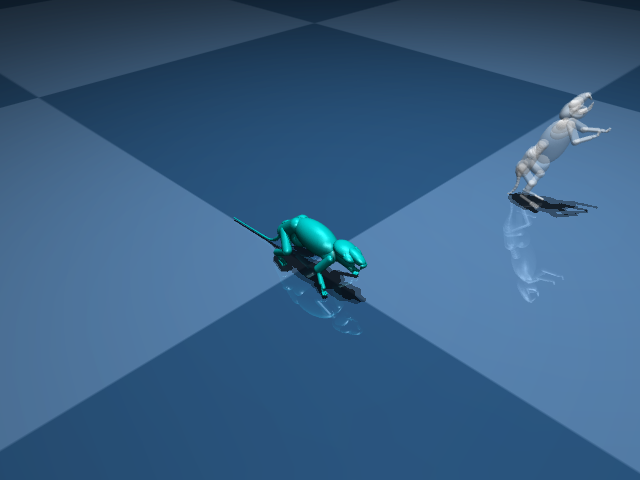

In [58]:
# Render a single frame of the starting pose
starting_frames = env.render([starting_state], camera=CAMERA_NAME, height=RENDER_HEIGHT, width=RENDER_WIDTH)

print(f"Starting pose preview ({START_MODE} mode):")
media.show_image(starting_frames[0])

## Create Prior Policy

This creates a policy that uses only the prior and decoder networks (no encoder, no trajectory observations).

In [59]:
def reparameterize(rng: jax.Array, mean: jax.Array, logvar: jax.Array) -> jax.Array:
    """Sample from a Gaussian distribution using the reparameterization trick."""
    std = jnp.exp(0.5 * logvar)
    eps = random.normal(rng, logvar.shape)
    return mean + eps * std


def create_prior_policy(
    policy_params: Tuple,
    action_size: int,
    proprioceptive_obs_size: int,
    intention_latent_size: int,
    decoder_hidden_layer_sizes: Tuple[int, ...],
    prior_hidden_layer_sizes: Tuple[int, ...],
    fixed_logvar: float = -2.0,
    deterministic: bool = False,
):
    """Create a policy function that uses only prior and decoder.
    
    Args:
        policy_params: Tuple of (normalizer_params, network_params).
        action_size: Size of action space.
        proprioceptive_obs_size: Size of proprioceptive observations.
        intention_latent_size: Size of latent space.
        decoder_hidden_layer_sizes: Decoder hidden layer sizes.
        prior_hidden_layer_sizes: Prior hidden layer sizes.
        fixed_logvar: Fixed log-variance for sampling (ignored if deterministic).
        deterministic: If True, use mean instead of sampling.
        
    Returns:
        Policy function (obs, rng) -> (action, extras)
    """
    # Extract parameters
    prior_params, decoder_params, normalizer_params = extract_prior_decoder_params(policy_params)
    
    # Create proprioceptive-only normalizer
    proprio_normalizer_params = running_statistics.RunningStatisticsState(
        count=normalizer_params.count,
        mean=normalizer_params.mean[-proprioceptive_obs_size:],
        summed_variance=normalizer_params.summed_variance[-proprioceptive_obs_size:],
        std=normalizer_params.std[-proprioceptive_obs_size:],
    )
    
    # Create action distribution
    parametric_action_distribution = distribution.NormalTanhDistribution(
        event_size=action_size
    )
    
    # Create prior and decoder modules
    prior_module = student_network.Prior(
        layer_sizes=list(prior_hidden_layer_sizes),
        latents=intention_latent_size,
    )
    
    decoder_module = student_network.Decoder(
        layer_sizes=list(decoder_hidden_layer_sizes) + [parametric_action_distribution.param_size],
    )
    
    def policy_fn(obs: jax.Array, rng_key: jax.Array) -> Tuple[jax.Array, dict]:
        """Generate actions from proprioceptive observations using prior + decoder."""
        key_sample, key_action = random.split(rng_key)
        
        # Get proprioceptive observations (last part of obs)
        proprioceptive_obs = obs[..., -proprioceptive_obs_size:]
        
        # Normalize observations
        normalized_obs = running_statistics.normalize(proprioceptive_obs, proprio_normalizer_params)
        
        # Get prior distribution
        prior_mean, prior_logvar = prior_module.apply(
            {"params": prior_params}, normalized_obs
        )
        
        # Use fixed logvar for more stable sampling
        fixed_logvar_array = jnp.full_like(prior_mean, fixed_logvar)
        
        # Sample from prior
        if deterministic:
            z = prior_mean
        else:
            z = reparameterize(key_sample, prior_mean, fixed_logvar_array)
        
        # Decode to action distribution parameters
        decoder_input = jnp.concatenate([z, normalized_obs], axis=-1)
        logits, _ = decoder_module.apply(
            {"params": decoder_params}, decoder_input
        )
        
        # Sample action from distribution
        if deterministic:
            action = parametric_action_distribution.mode(logits)
        else:
            raw_action = parametric_action_distribution.sample_no_postprocessing(logits, key_action)
            action = parametric_action_distribution.postprocess(raw_action)
        
        extras = {
            "prior_mean": prior_mean,
            "prior_logvar": prior_logvar,
            "intention": z,
            "logits": logits,
        }
        
        return action, extras
    
    return policy_fn

In [60]:
# Create the prior policy
prior_policy = create_prior_policy(
    policy_params=policy_params,
    action_size=cfg.network_config.action_size,
    proprioceptive_obs_size=proprioceptive_obs_size,
    intention_latent_size=cfg.network_config.intention_size,
    decoder_hidden_layer_sizes=tuple(cfg.network_config.decoder_layer_sizes),
    prior_hidden_layer_sizes=tuple(cfg.network_config.get("prior_layer_sizes", cfg.network_config.encoder_layer_sizes)),
    fixed_logvar=FIXED_LOGVAR,
    deterministic=DETERMINISTIC,
)

print(f"Created prior policy (deterministic={DETERMINISTIC}, fixed_logvar={FIXED_LOGVAR})")

Created prior policy (deterministic=False, fixed_logvar=-5.0)


## Vectorized Prior Rollout

Perform multiple rollouts in parallel using `jax.lax.scan` (no for loops) and `jax.vmap`.

In [61]:
def create_vectorized_rollout_fn(env, policy_fn, max_steps: int, proprioceptive_obs_size: int, starting_state):
    """Create a vectorized rollout function that starts from a fixed initial state.
    
    Uses jax.lax.scan for single rollout (no for loop) and jax.vmap for parallel rollouts.
    All rollouts start from the same initial state but with different random keys for actions.
    
    Args:
        env: The environment.
        policy_fn: Policy function (obs, rng) -> (action, extras).
        max_steps: Maximum steps per rollout.
        proprioceptive_obs_size: Size of proprioceptive observations.
        starting_state: The initial state for all rollouts.
        
    Returns:
        Tuple of (vmapped_rollout_fn, jit_step)
    """
    jit_step = jax.jit(env.step)
    
    def single_rollout_fn(rng_key: jax.Array):
        """Run a single prior rollout from the fixed starting state."""
        # Start from the provided starting state (same for all rollouts)
        state = starting_state
        
        def step_fn(carry, _):
            state, key, nan_terminated = carry
            key, key_action = random.split(key)
            
            # Get proprioceptive observations
            if hasattr(state.obs, 'get') or isinstance(state.obs, dict):
                proprio = state.obs.get("proprioception", state.obs)
                if isinstance(proprio, dict):
                    from jax import flatten_util
                    proprio, _ = flatten_util.ravel_pytree(proprio)
            else:
                proprio = state.obs
            
            # Get action from prior policy
            action, _ = policy_fn(proprio, key_action)
            
            # Step environment
            next_state = jit_step(state, action)
            
            # Check for NaN (cheap, run every step)
            step_nan = check_termination_nan(next_state.data)
            new_nan_terminated = jnp.logical_or(nan_terminated, step_nan)
            
            return (next_state, key, new_nan_terminated), next_state
        
        initial_carry = (state, rng_key, jnp.array(False))
        (_, _, nan_terminated), all_states = jax.lax.scan(
            step_fn, initial_carry, None, length=max_steps
        )
        
        # Compute world z-axis termination AFTER rollout (batch compute)
        upside_down_flags = compute_world_zaxis_termination(env, all_states.data)
        
        # Find first termination step
        any_upside_down = jnp.any(upside_down_flags)
        first_upside_down_step = jnp.argmax(upside_down_flags)
        
        # Combine termination conditions
        terminated = jnp.logical_or(nan_terminated, any_upside_down)
        step_count = jnp.where(
            any_upside_down,
            first_upside_down_step + 1,
            max_steps
        )
        
        return step_count, terminated, all_states
    
    # Vmap and jit the rollout function
    vmapped_rollout = jax.jit(jax.vmap(single_rollout_fn))
    
    return vmapped_rollout, jit_step

In [62]:
# Create the vectorized rollout function with the configured starting state
vmapped_rollout, jit_step = create_vectorized_rollout_fn(
    env=env,
    policy_fn=prior_policy,
    max_steps=MAX_STEPS,
    proprioceptive_obs_size=proprioceptive_obs_size,
    starting_state=starting_state,
)

print(f"Created vectorized rollout function for {NUM_ROLLOUTS} rollouts of {MAX_STEPS} steps each")
print(f"All rollouts will start from: {START_MODE}" + (f" (clip {CLIP_IDX}, frame {START_FRAME})" if START_MODE == "clip" else ""))

Created vectorized rollout function for 4 rollouts of 500 steps each
All rollouts will start from: neutral


In [63]:
# Generate random keys for rollouts
rng = random.PRNGKey(SEED)
rollout_keys = random.split(rng, NUM_ROLLOUTS)

# Run all rollouts in parallel (first run will compile)
print("Running rollouts (first run includes compilation time)...")
import time
t_start = time.time()

step_counts, terminated_flags, all_rollout_states = vmapped_rollout(rollout_keys)

# Block until complete
step_counts = jnp.array(step_counts)
step_counts.block_until_ready()

print(f"Completed {NUM_ROLLOUTS} rollouts in {time.time() - t_start:.2f}s")
print(f"Step counts: {step_counts}")
print(f"Termination rate: {jnp.mean(terminated_flags.astype(jnp.float32)):.2%}")
print(f"Average steps: {jnp.mean(step_counts):.1f}")
print(f"Max steps reached: {jnp.sum(step_counts >= MAX_STEPS)}/{NUM_ROLLOUTS}")

Running rollouts (first run includes compilation time)...
Completed 4 rollouts in 198.18s
Step counts: [240 269 500 462]
Termination rate: 75.00%
Average steps: 367.8
Max steps reached: 1/4


## Render Rollouts

Render each rollout to video.

In [64]:
def render_rollout(env, states, num_steps: int, camera: str, height: int = 480, width: int = 640):
    """Render a rollout to frames.
    
    Args:
        env: The environment.
        states: Stacked states from rollout (shape: [max_steps, ...]).
        num_steps: Number of steps to render.
        camera: Camera name for rendering.
        height: Frame height.
        width: Frame width.
        
    Returns:
        List of frames (numpy arrays).
    """
    # Convert stacked states to list
    states_list = []
    for i in range(num_steps):
        state_i = jax.tree_util.tree_map(lambda x: x[i], states)
        states_list.append(state_i)
    
    # Render all frames at once
    frames = env.render(states_list, camera=camera, height=height, width=width)
    
    return frames

In [65]:
# Render rollouts
if SAVE_VIDEOS:
    output_dir = CHECKPOINT_PATH / "prior_rollouts"
    output_dir.mkdir(exist_ok=True)
    print(f"Rendering and saving {NUM_ROLLOUTS} rollouts to {output_dir}")
else:
    print(f"Rendering {NUM_ROLLOUTS} rollouts (not saving to disk)")

all_videos = []
for i in range(NUM_ROLLOUTS):
    # Extract states for this rollout
    rollout_states = jax.tree_util.tree_map(lambda x: x[i], all_rollout_states)
    step_count = int(step_counts[i])
    
    print(f"  Rendering rollout {i+1}/{NUM_ROLLOUTS} (terminated at step {step_count}, rendering all {MAX_STEPS})...")
    
    # Render all frames (including post-termination)
    frames = render_rollout(
        env=env,
        states=rollout_states,
        num_steps=MAX_STEPS,
        camera=CAMERA_NAME,
        height=RENDER_HEIGHT,
        width=RENDER_WIDTH,
    )
    
    all_videos.append(frames)
    
    # Save video if enabled
    if SAVE_VIDEOS:
        mode_str = "deterministic" if DETERMINISTIC else f"logvar{FIXED_LOGVAR}"
        start_str = "neutral" if START_MODE == "neutral" else f"clip{CLIP_IDX}_frame{START_FRAME}"
        video_path = output_dir / f"prior_rollout_{i:02d}_{start_str}_{mode_str}.mp4"
        
        with imageio.get_writer(str(video_path), fps=RENDER_FPS) as writer:
            for frame in frames:
                writer.append_data(frame)
        print(f"    Saved to {video_path}")

print(f"\nRendering complete!")

Rendering 4 rollouts (not saving to disk)
  Rendering rollout 1/4 (terminated at step 240, rendering all 500)...
  Rendering rollout 2/4 (terminated at step 269, rendering all 500)...
  Rendering rollout 3/4 (terminated at step 500, rendering all 500)...
  Rendering rollout 4/4 (terminated at step 462, rendering all 500)...

Rendering complete!


## Display Videos

### distill_kl_sweep_PD_1e-4_251229_113415_150632

### Deterministic

In [19]:
# Display the first rollout
if len(all_videos) > 0:
    print(f"Displaying rollout 0 ({len(all_videos[0])} frames)")
    media.show_video(all_videos[0], fps=RENDER_FPS)

Displaying rollout 0 (500 frames)


In [20]:
media.show_video(all_videos[1], fps=RENDER_FPS)

### logvar = -4.0

In [38]:
media.show_video(all_videos[0], fps=RENDER_FPS)

In [39]:
media.show_video(all_videos[1], fps=RENDER_FPS)

### logvar = -5.0

In [47]:
media.show_video(all_videos[0], fps=RENDER_FPS)

In [48]:
media.show_video(all_videos[1], fps=RENDER_FPS)

### distill_kl_sweep_PD_1e-2_251229_113700_032703

### logvar = -5.0

In [66]:
media.show_video(all_videos[0], fps=RENDER_FPS)

In [67]:
media.show_video(all_videos[1], fps=RENDER_FPS)

In [ ]:
# Display the best (longest) rollout
best_idx = int(jnp.argmax(step_counts))
print(f"Displaying best rollout (index {best_idx}, {int(step_counts[best_idx])} steps)")
media.show_video(all_videos[best_idx], fps=RENDER_FPS)

## Summary Statistics

In [ ]:
print("=" * 50)
print("PRIOR ROLLOUT SUMMARY")
print("=" * 50)
print(f"Checkpoint: {CHECKPOINT_PATH}")
print(f"Starting pose: {START_MODE}" + (f" (clip {CLIP_IDX}, frame {START_FRAME})" if START_MODE == "clip" else " (model qpos0)"))
print(f"Policy mode: {'Deterministic (mean)' if DETERMINISTIC else f'Stochastic (fixed_logvar={FIXED_LOGVAR})'}")
print(f"Number of rollouts: {NUM_ROLLOUTS}")
print(f"Max steps: {MAX_STEPS}")
print()
print("Results:")
print(f"  Average steps: {float(jnp.mean(step_counts)):.1f}")
print(f"  Std steps: {float(jnp.std(step_counts)):.1f}")
print(f"  Min steps: {int(jnp.min(step_counts))}")
print(f"  Max steps: {int(jnp.max(step_counts))}")
print(f"  Termination rate: {float(jnp.mean(terminated_flags)):.1%}")
print(f"  Max steps reached: {int(jnp.sum(step_counts >= MAX_STEPS))}/{NUM_ROLLOUTS}")
print("=" * 50)